# Loading

In [1]:
# Computational imports
import numpy as np   # Library for n-dimensional arrays
import pandas as pd  # Library for dataframes (structured data)

# Helper imports
import os 
import warnings
# import pandas_datareader as web
import datetime as dt

# ML/DL imports
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.layers import LSTM, Dense, Dropout, RepeatVector, TimeDistributed,GRU,Embedding
from sklearn.preprocessing import MinMaxScaler, OrdinalEncoder
from sklearn.metrics import mean_squared_error, mean_squared_log_error
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Plotting imports
import matplotlib.pyplot as plt
import matplotlib.dates as dates
# import plotly.express as px
# import plotly.graph_objects as go
# import plotly.figure_factory as ff
# from plotly.subplots import make_subplots
# from plotly.offline import init_notebook_mode, iplot

# Set seeds to make the experiment more reproducible.
from numpy.random import seed
import json
seed(1)
filepath='model4/'

In [2]:
train_data = pd.read_csv('train.csv', index_col=0)
test_data = pd.read_csv('test.csv', index_col=0)
data_oil = pd.read_csv('oil.csv')
samp_subm = pd.read_csv('sample_submission.csv')
data_holi = pd.read_csv('holidays_events.csv')
data_store =  pd.read_csv('stores.csv')
data_trans = pd.read_csv('transactions.csv')


C:\Users\User\AppData\Roaming\Python\Python37\site-packages\numpy\lib\arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [3]:
## holiday 重複的部分做處理
#  type：{'holiday':3,'transfer':4,'addition:'0','bridge':1,'work day':5,'event':2} nan=6
#  local:{'local':0,'region':1,'nation':2} nan=3
data_holi = data_holi[['date','type','locale']]
data_holi['locale'].replace({'Local':1,'Regional':2,'National':3},inplace=True)
data_holi['type'].replace({'Holiday':6,'Transfer':5,'Additional':4,'Bridge':3,'Event':2,'Work Day':1},inplace=True)
data_holi[['type','locale']]=data_holi[['type','locale']].astype(int)
data_holi = data_holi.groupby(['date'],as_index=False).agg({'type':'mean','locale':'first'})

In [4]:
all_data = pd.concat([train_data,test_data],ignore_index=True)
all_data['date'] =  pd.to_datetime(all_data['date'])
data_holi['date'] = pd.to_datetime(data_holi['date'])
data_oil['date'] = pd.to_datetime(data_oil['date'])

In [5]:
df_train1 = all_data.merge(data_holi, on = 'date', how='left')
df_train1 = df_train1.merge(data_oil, on = 'date', how='left')
df_train1 = df_train1.merge(data_store, on = 'store_nbr', how='left')
df_train1 = df_train1.rename(columns = {"type_x" : "holiday_type", "type_y" : "store_type"})
df_train1['day_of_week'] = df_train1['date'].dt.day_name()


In [6]:
train_columns = ['date','store_nbr','family','sales','onpromotion','holiday_type','locale','dcoilwtico','store_type','cluster','day_of_week']
df = df_train1[train_columns]
# df['year'] = df['date'].dt.year
# df['month'] = df['date'].dt.month
# df['week'] = df['date'].dt.isocalendar().week
# df['quarter'] = df['date'].dt.quarter

In [7]:
num_test,num_train = len(test_data),len(train_data)

In [8]:
df_copy = df.copy()

# EDA
df = train + test

### 圖示化


In [9]:

# buf = df[['date','store_nbr','sales','family']].groupby(['store_nbr','family','date'],as_index = False).agg({"sales":"mean"})
# store = []
# for i in range(1,55):
#     f = list(buf[buf['store_nbr']==i].drop(columns = ['store_nbr']).groupby(['family']))
#     store1 = f[0][1].drop(columns=['family'])
#     for i in range(1,33):
#         store1 = store1.merge(f[i][1].drop(columns=['family']), on = 'date', how='left')
#         store1 = store1.rename(columns = {"sales_x": "sales" ,"sales_y" : f[i][0]})
#     store1 = store1.rename(columns = {"sales": f[0][0]})  
#     store.append(store1)


### Transform

In [10]:
df =df_copy.copy()

In [11]:
# df.info()
# df.isnull().sum()

In [12]:
df['holiday_type'].fillna(0,inplace=True)
df['locale'].fillna(0,inplace=True)
df['dcoilwtico'].fillna(df['dcoilwtico'].mean(),inplace=True)
# df.isnull().sum()
df['day_of_week'].replace({'Monday':1,'Tuesday':2,'Wednesday':3,'Thursday':4,'Friday':5,'Saturday':6,'Sunday':7},inplace=True)
df['day_of_week'] = df['day_of_week'].astype(int)

In [13]:
object_cols = [cname for cname in df.columns if df[cname].dtype == "object"]
number_cols = [cname for cname in df.columns if df[cname].dtype!="object" and cname!='date' and cname!='sales']
print(object_cols,number_cols)

['family', 'store_type'] ['store_nbr', 'onpromotion', 'holiday_type', 'locale', 'dcoilwtico', 'cluster', 'day_of_week']


In [14]:
ordinal_encoder = OrdinalEncoder()
df[object_cols] = ordinal_encoder.fit_transform(df[object_cols])

### Seperate By family

In [15]:
print(df['date'].max()-df['date'].min())

1703 days 00:00:00


In [16]:
plt.rcParams["figure.figsize"] = (25, 6)

In [17]:
condition ={
    'store_nbr':'mean',#!
    'family':'mean',
    'onpromotion':'mean',#!
    'holiday_type':'mean', #!
    'locale':'mean',#!
    'dcoilwtico':'mean',#!
    'store_type':'mean',#!
    'cluster':'mean',#!
    'day_of_week':'mean'#!
    }
train_condition = condition.copy()
train_condition['sales'] ='sum'

In [18]:
train_x_all = df.copy()
train_x_all = train_x_all[["family","store_nbr","date","sales"]]

In [19]:
train_x_all = list(train_x_all.groupby(["family"]))

In [20]:
print(train_x_all[0])

(0.0,          family  store_nbr       date  sales
0           0.0          1 2013-01-01    0.0
33          0.0         10 2013-01-01    0.0
66          0.0         11 2013-01-01    0.0
99          0.0         12 2013-01-01    0.0
132         0.0         13 2013-01-01    0.0
...         ...        ...        ...    ...
3029235     0.0         54 2017-08-31    NaN
3029268     0.0          6 2017-08-31    NaN
3029301     0.0          7 2017-08-31    NaN
3029334     0.0          8 2017-08-31    NaN
3029367     0.0          9 2017-08-31    NaN

[91800 rows x 4 columns])


C:\ProgramData\Anaconda3\envs\ProjectPy37\lib\site-packages\pandas\plotting\_matplotlib\core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


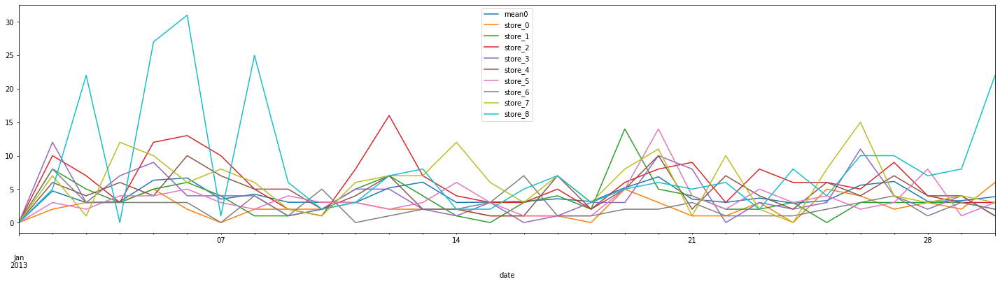

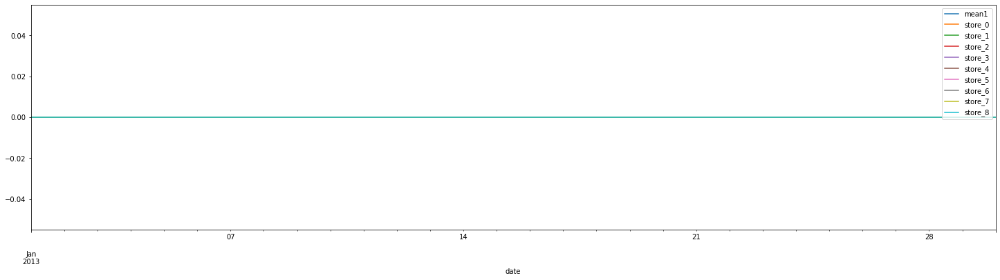

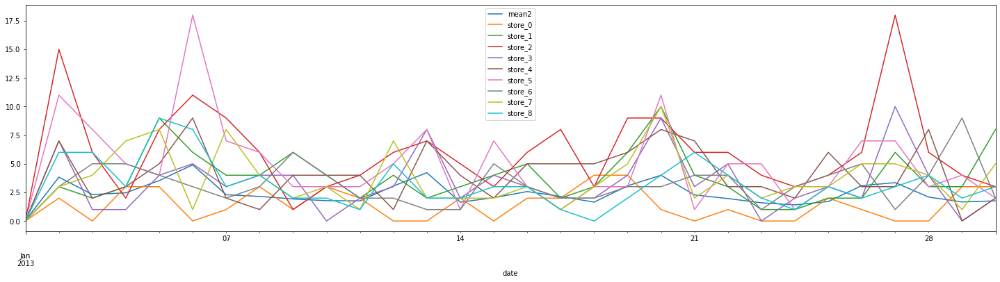

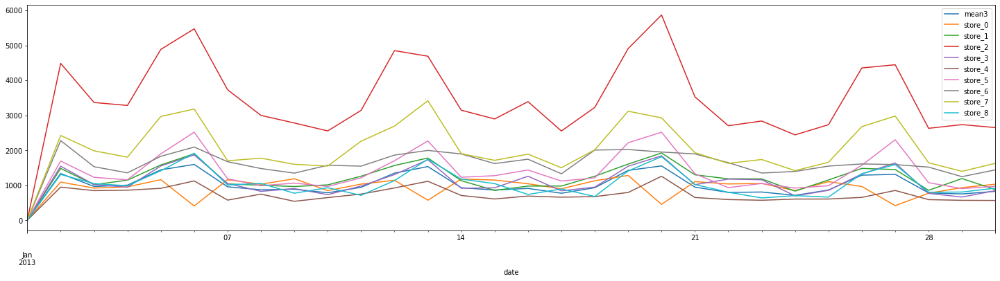

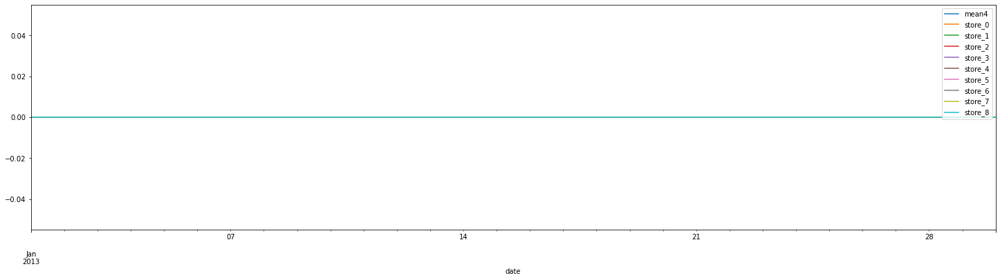

...

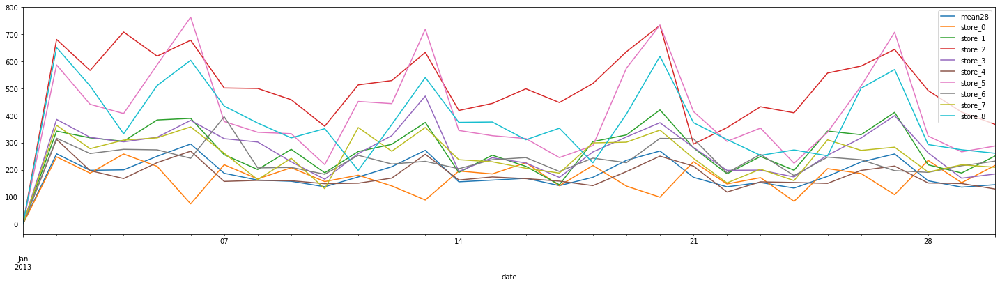

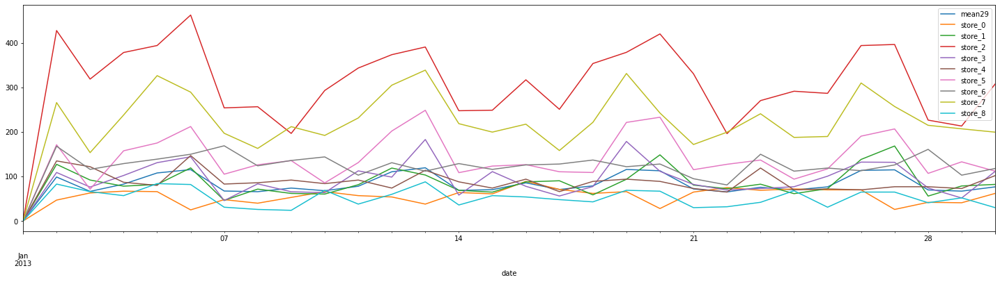

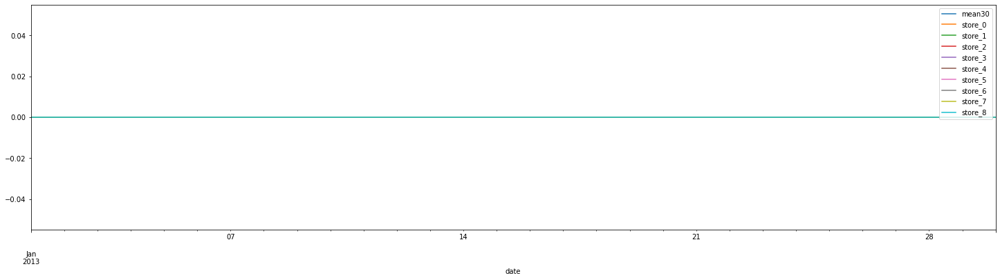

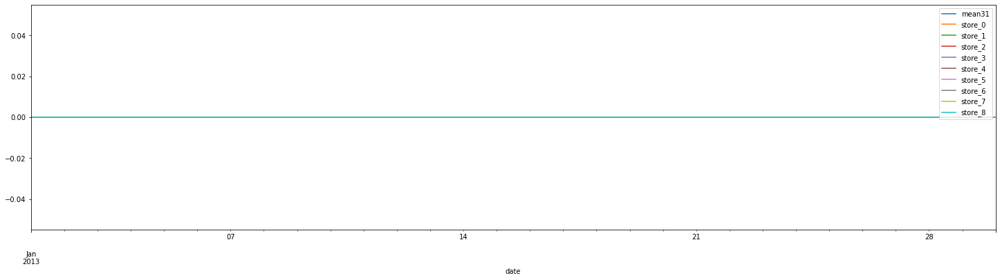

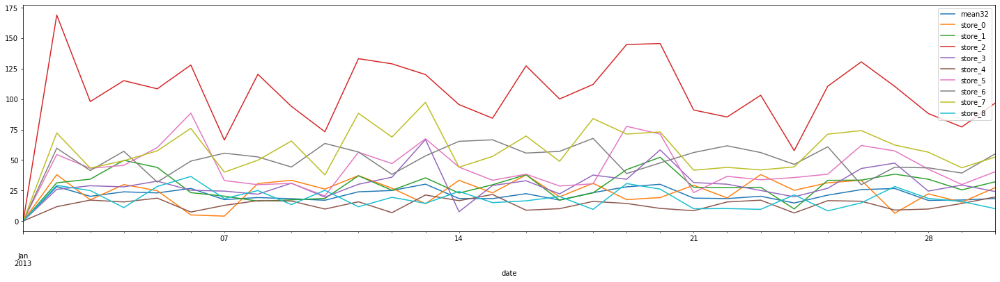

In [22]:
train_f_map=list()
for i in range(len(train_x_all)):
    family_num,train_x = train_x_all[i][0],train_x_all[i][1]
    compare_store = train_x.groupby(['date'],as_index=False).agg({'sales':"mean"}).rename(columns={"sales":"mean"+str(i)})
    store = list(train_x.groupby(['store_nbr'],as_index=False))
    for s in range(len(store)):
        table = store[s][1]
        table = table.groupby(['date'],as_index=False).agg({"sales":"mean"}) #max min mean 都一樣
        # table['sales'] = [abs(compare_store['mean'][m]-table['sales'][m]) for m in range(len(table['sales']))]
        table.rename(columns={"sales":"store_"+str(s)},inplace=True)
        compare_store = compare_store.merge(table,on='date',how='left')
    compare_store.set_index("date",inplace=True)
    # compare_store.iloc[588] = compare_store.iloc[588].fillna(0)
    # compare_store.iloc[:30,:10].plot()
    # plt.savefig("eda3/分類商品/商品 "+str(i)+" 在每間店的銷售價")
    train_f_map.append([compare_store])
    # if i ==2:break


In [25]:
start_date,end_date = '2017-04-01','2017-08-15'

No handles with labels found to put in legend.


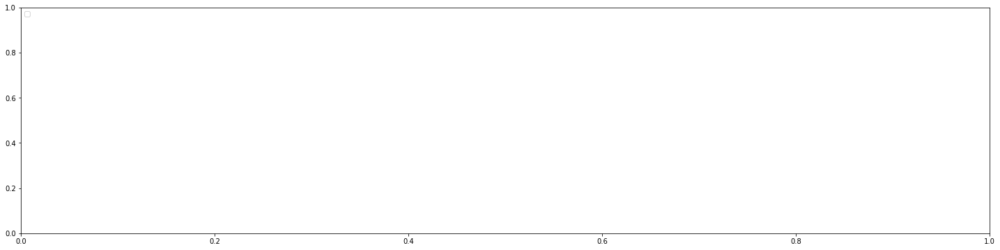

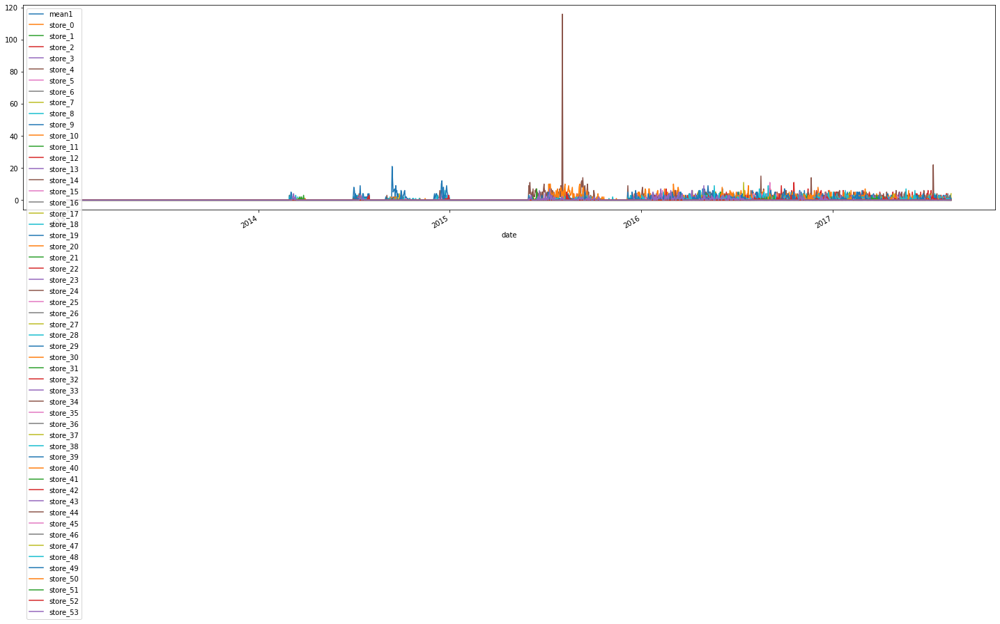

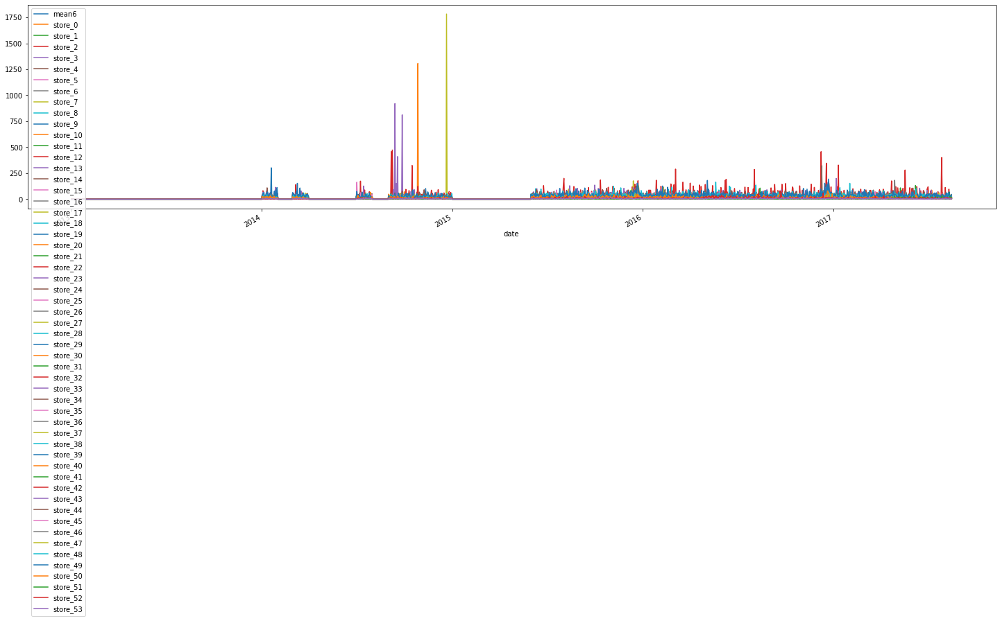

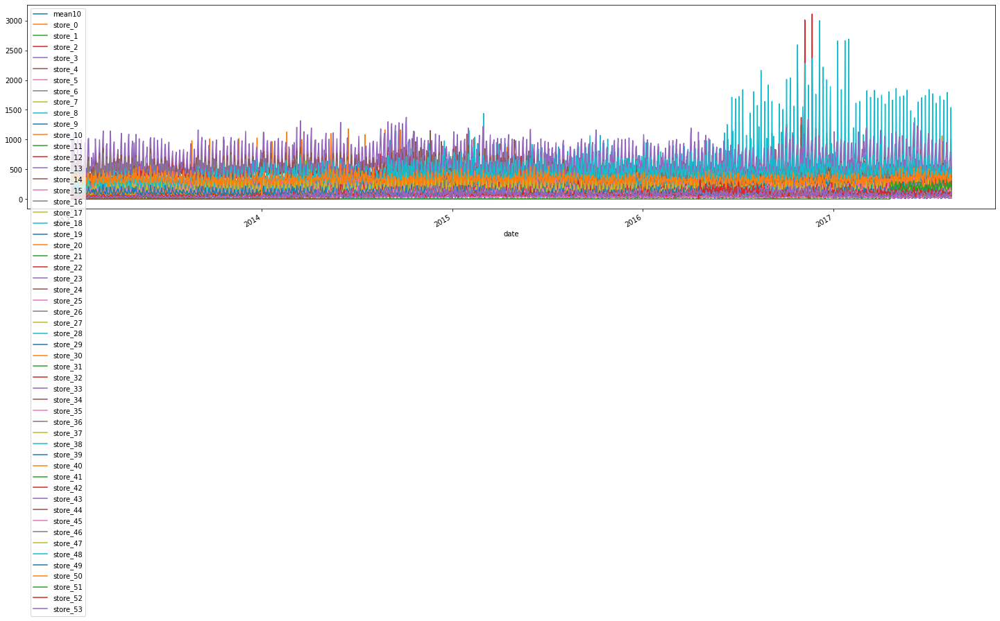

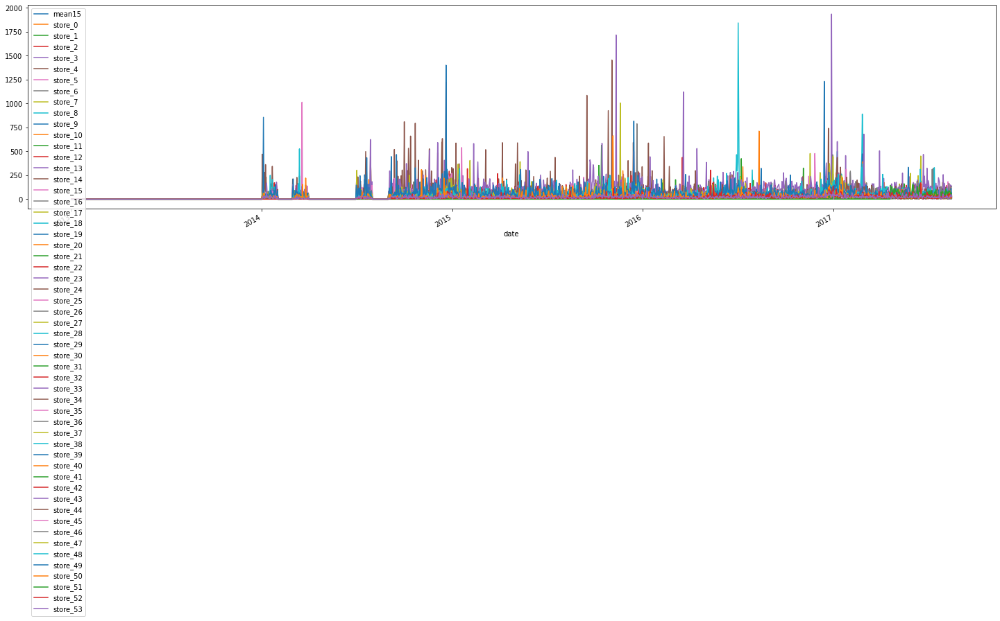

...

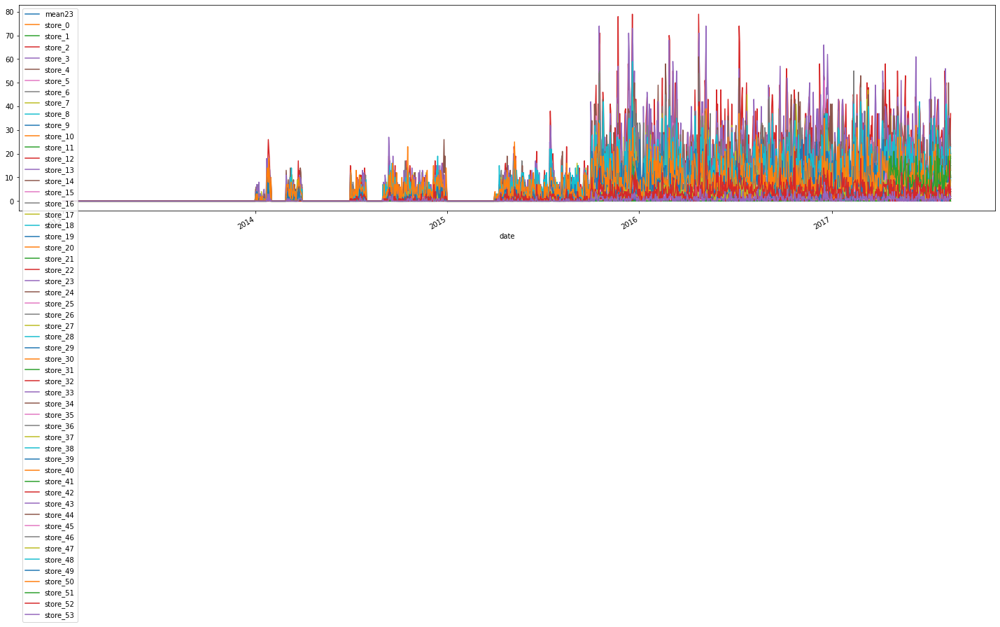

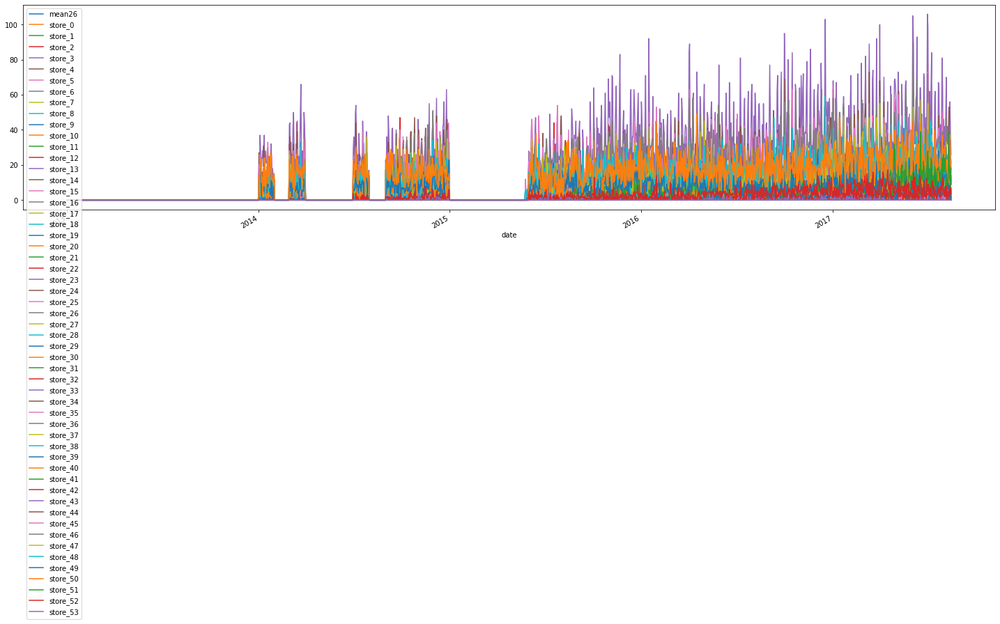

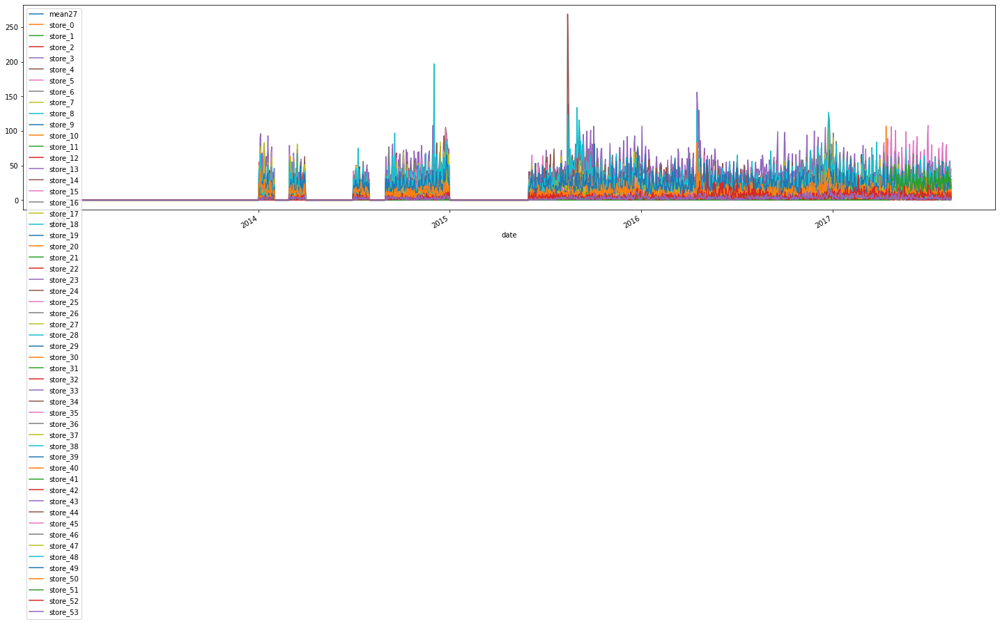

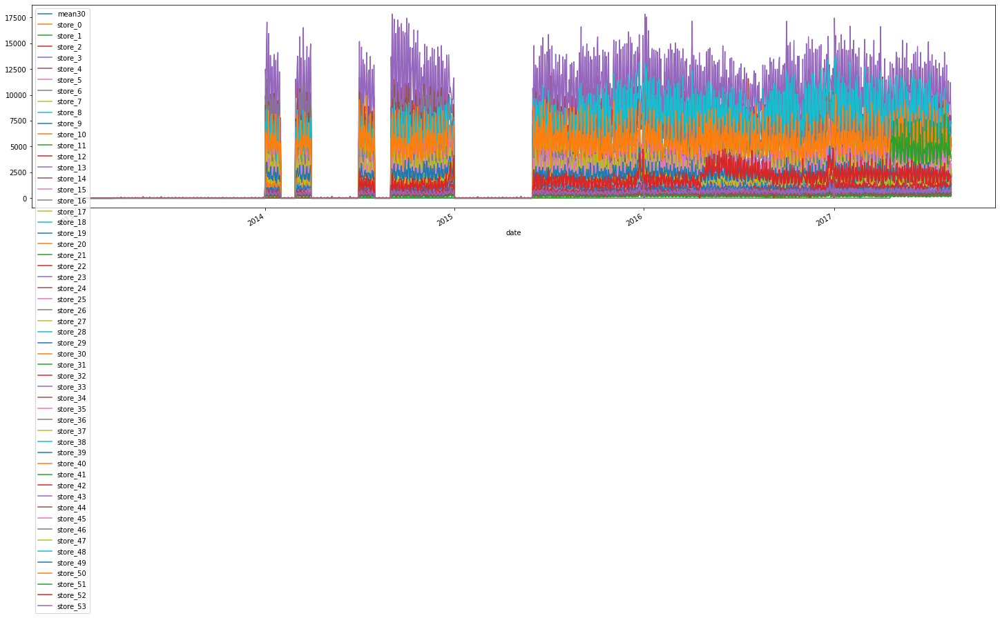

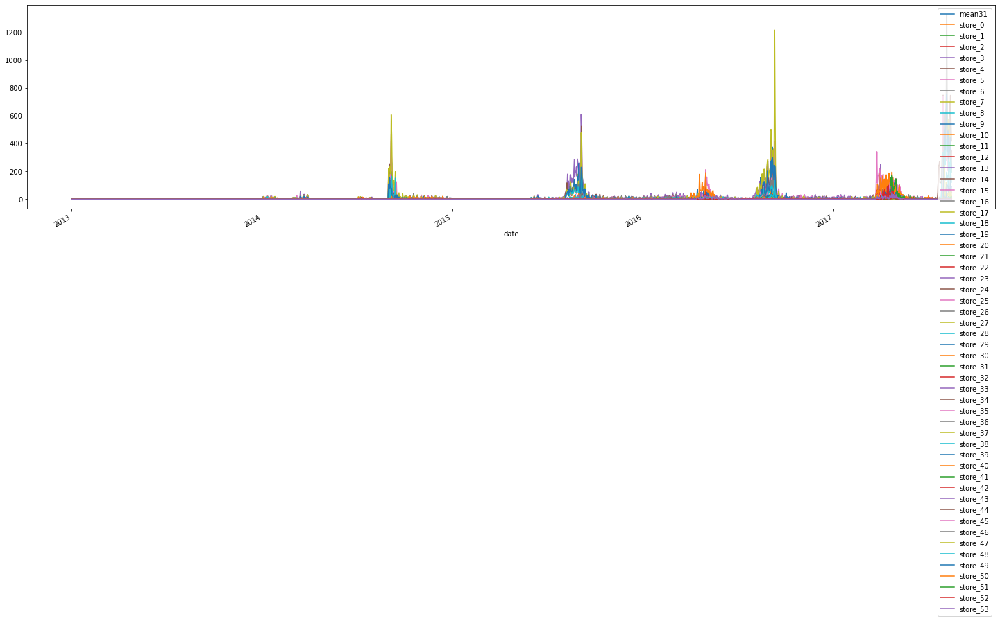

In [55]:
group = [31,30,27,26,23,19,18,16,15,10,6,1]

for i in range(len(train_f_map)):
    if i in group:
        compare_store = train_f_map[i][0]
        plt.legend(loc='upper left')
        
        compare_store.plot()
        

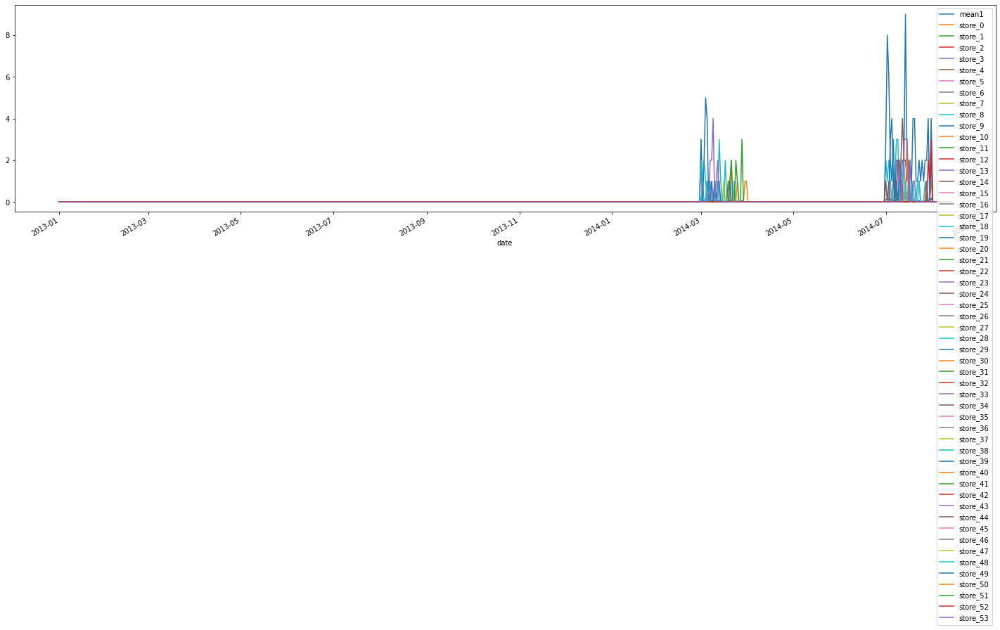

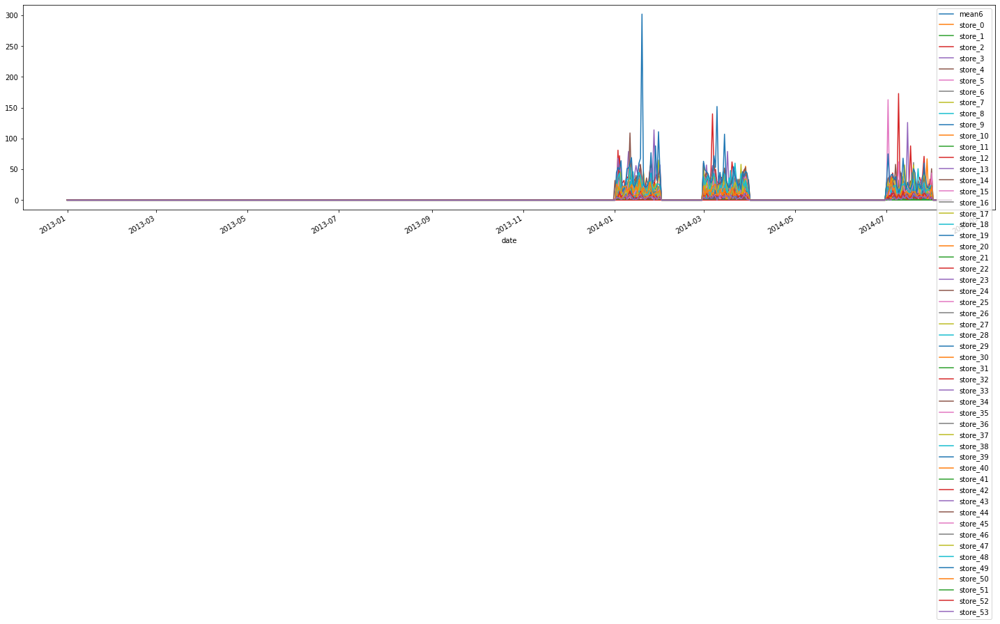

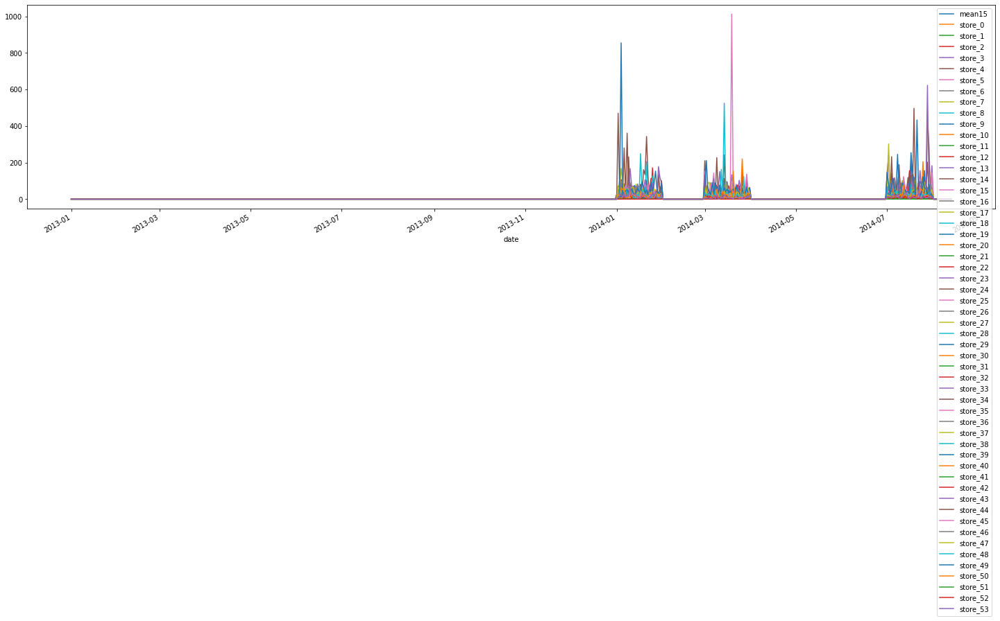

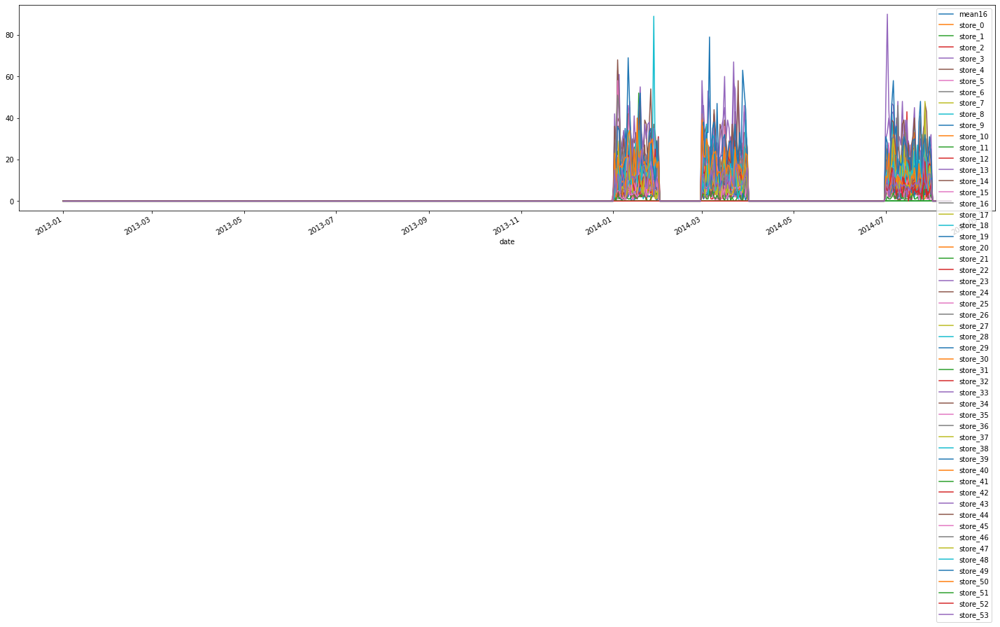

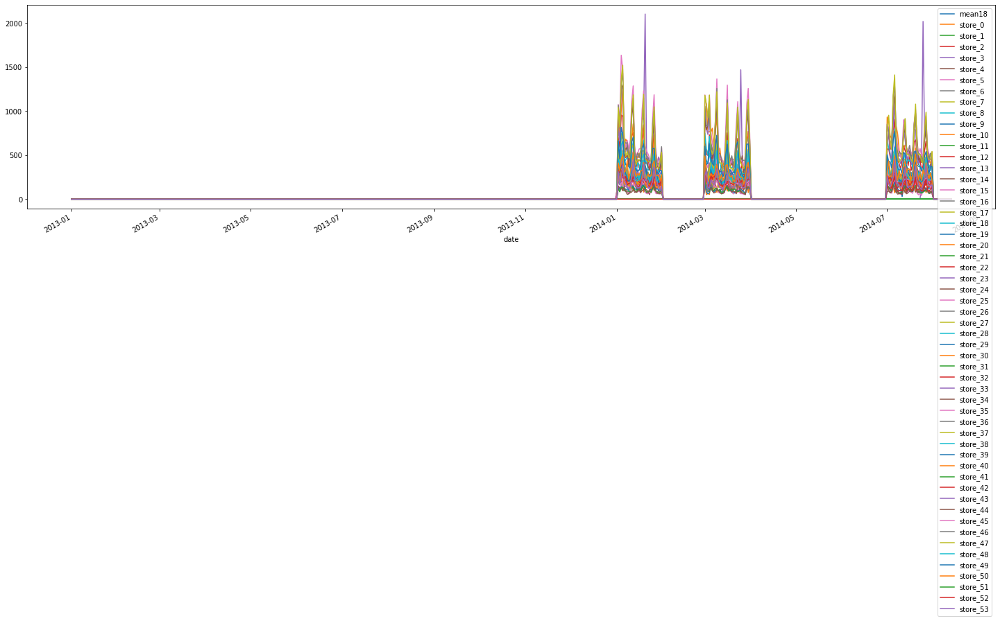

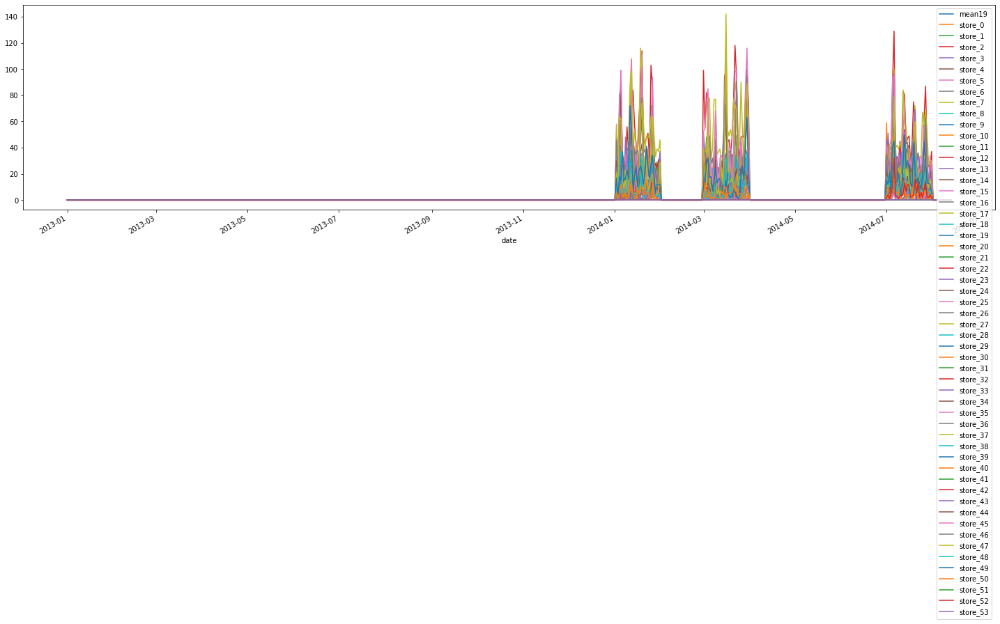

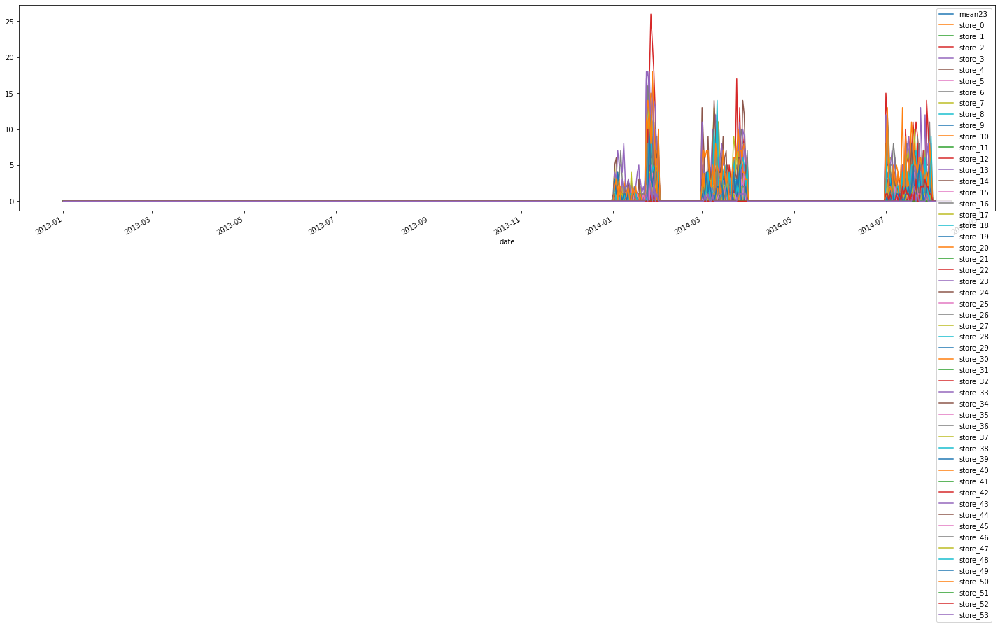

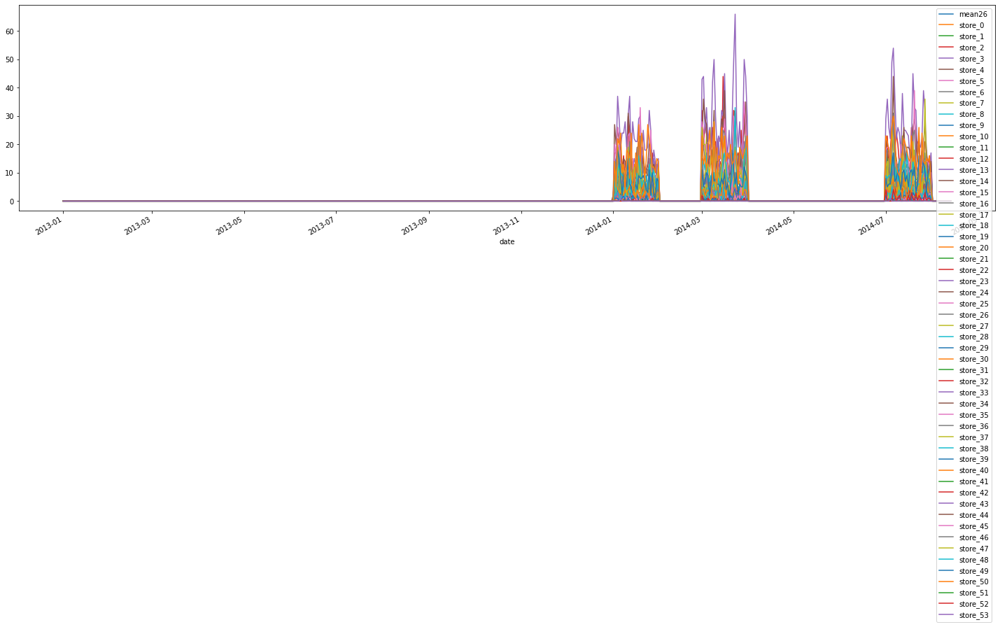

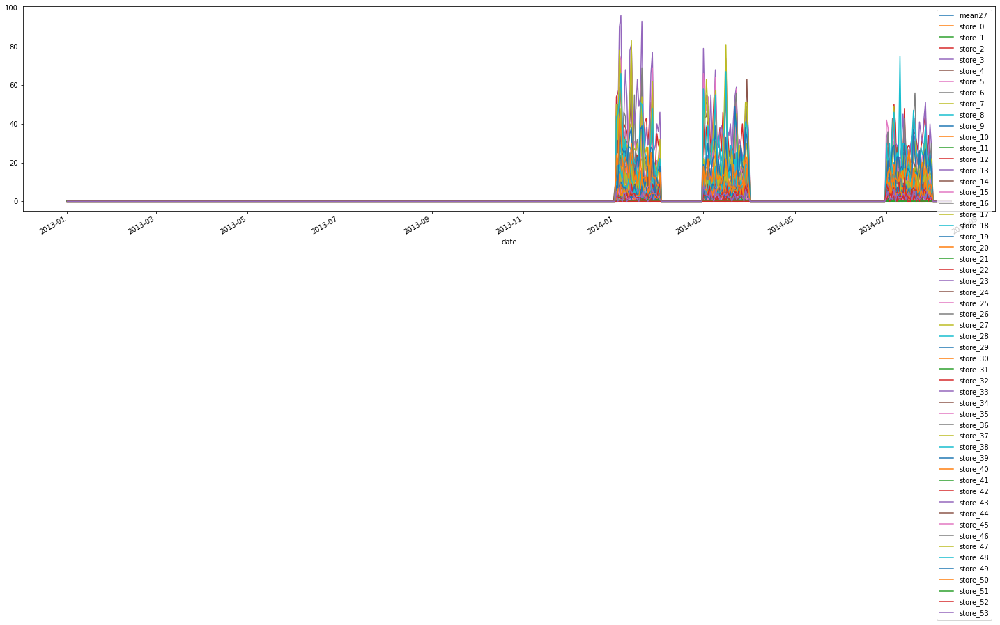

In [71]:
# group family {30,31}
# i = 4{always0 in every store}
group = [27,26,23,19,18,16,15,6,1]
for i in range(len(train_f_map)):
    if i in group:
        compare_store = train_f_map[i][0]
        compare_store.iloc[:589].plot()
        plt.savefig("eda3\group0\item"+str(i))

<AxesSubplot:xlabel='date'>

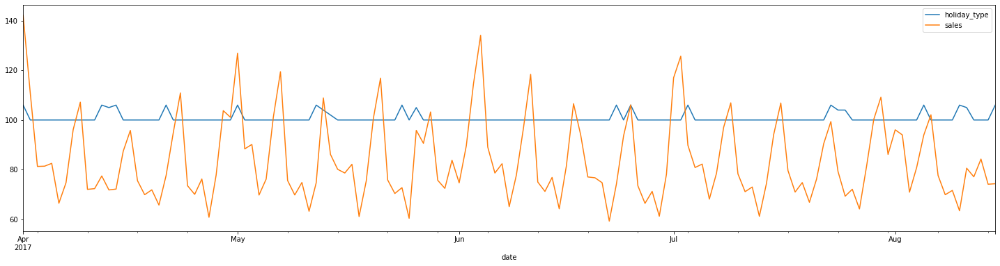

In [53]:
group = [31,30,27,26,23,19,18,16,15,10,6,1]
df1 = df[(df.family!=27) & (df.family!=26) & (df.family!=23) & (df.family!=19) & (df.family!=18) & (df.family!=16) & (df.family!=15) & (df.family!=6) & (df.family!=1)]
buf1 = df1.groupby(["date"]).agg({"holiday_type":lambda x:x.mean()+100,"sales":lambda x:x.sum()*0.0001})
buf1[start_date:end_date].plot()
# buf = df.groupby(["date"]).agg({"holiday_type":lambda x:x.mean()+df.loc[start_date:end_date].sales.mean(),"sales":"sum"})
# buf[start_date:end_date].plot()

<AxesSubplot:xlabel='date'>

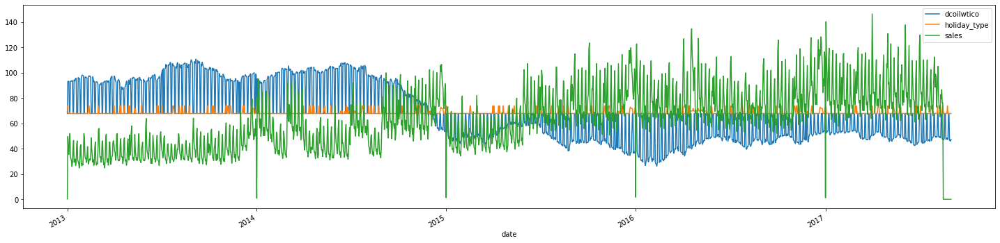

In [46]:
buf = df.groupby(["date"]).agg({"dcoilwtico":"mean","holiday_type":lambda x : x.mean() + df.dcoilwtico.mean(),"sales":lambda x:x.sum()*0.0001})
buf.plot()


<AxesSubplot:xlabel='date'>

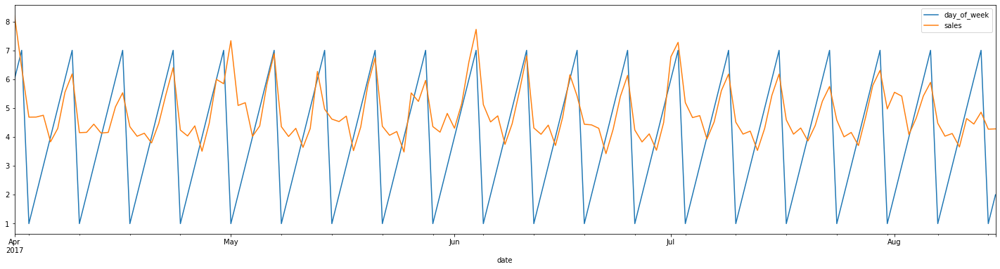

In [48]:
buf = df.groupby(['date']).agg({"day_of_week":"mean","sales":lambda x:x.mean()*0.01})
buf.loc[start_date:end_date].plot()
    

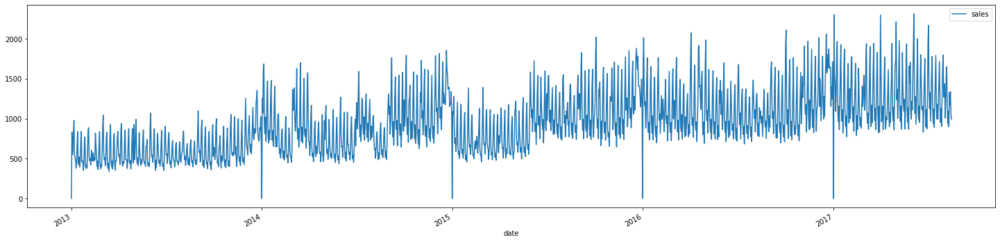

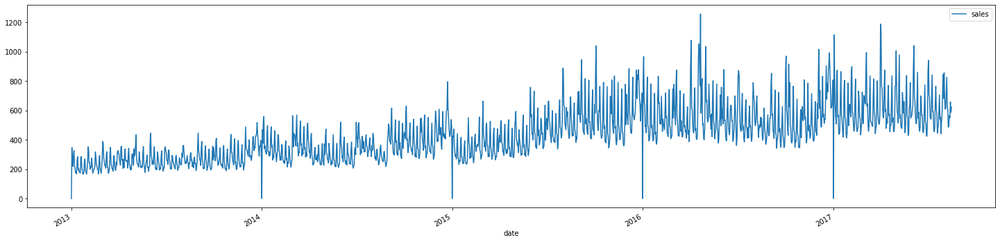

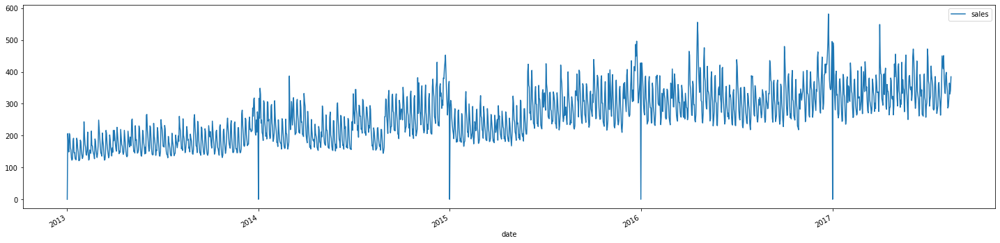

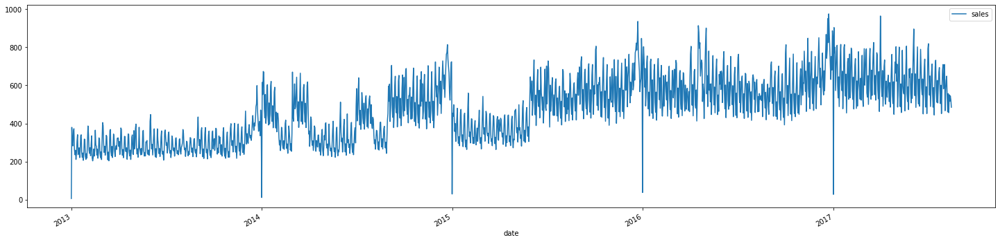

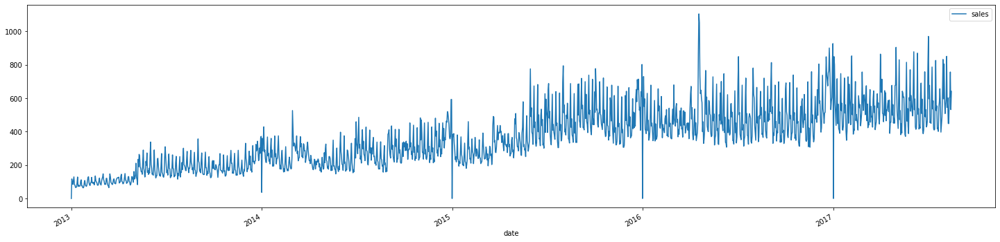

In [29]:
df1 = df[(df.family!=27) & (df.family!=26) & (df.family!=23) & (df.family!=19) & (df.family!=18) & (df.family!=16) & (df.family!=15) & (df.family!=6) & (df.family!=1)]

buf = list(df1.groupby(['store_type']))
for i in range(len(buf)):
    table = buf[i][1].groupby(['date']).agg({"sales":"mean"})
    table.plot()
    

C:\ProgramData\Anaconda3\envs\ProjectPy37\lib\site-packages\pandas\plotting\_matplotlib\core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


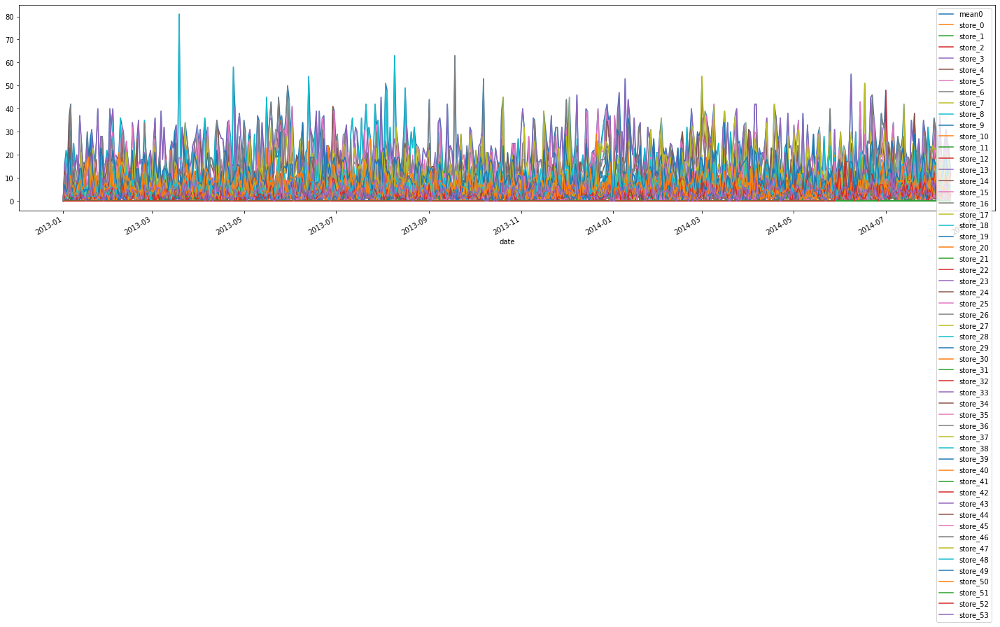

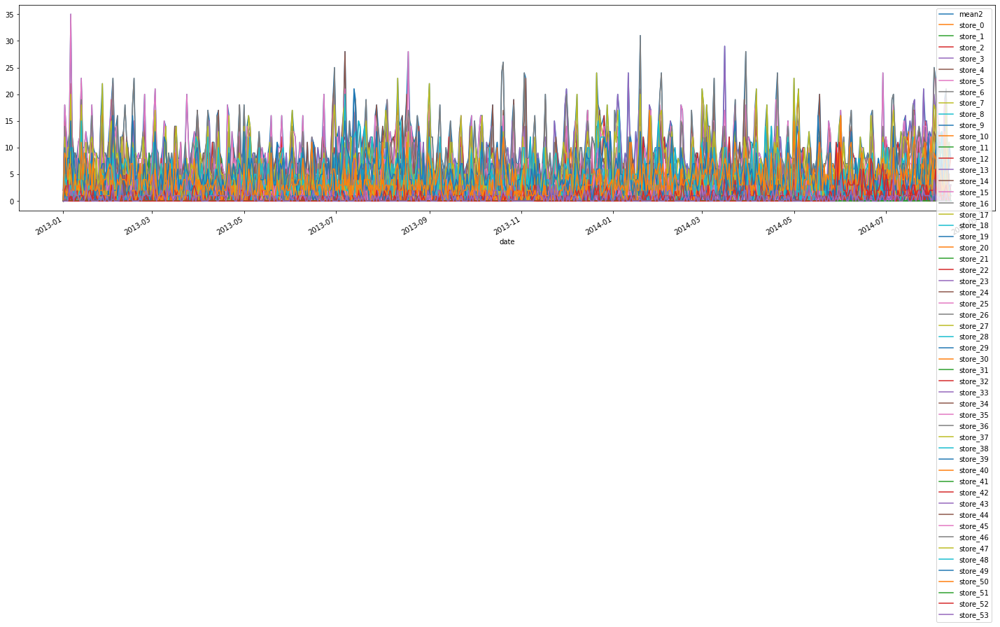

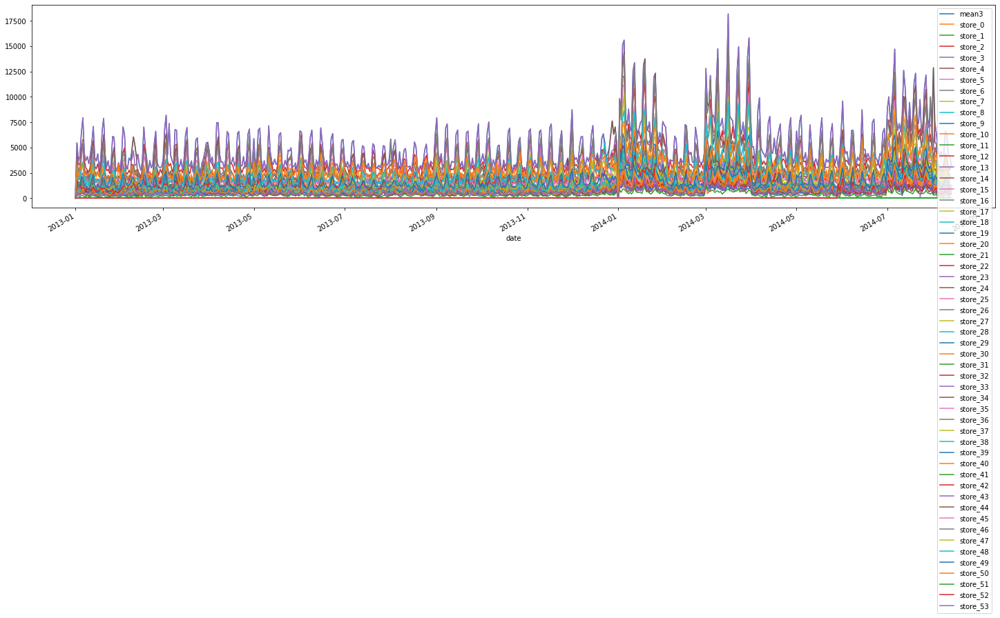

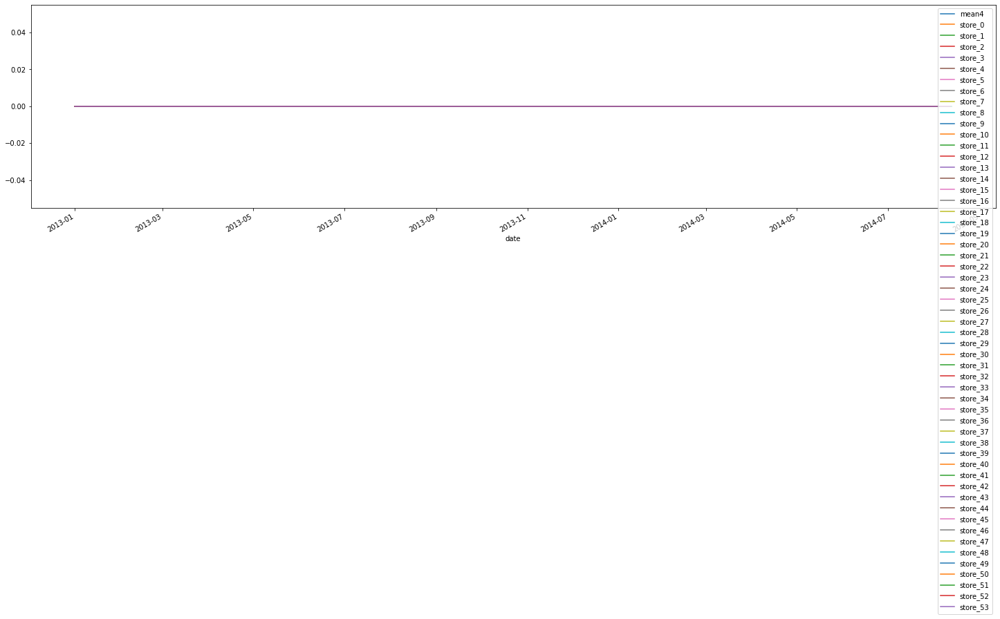

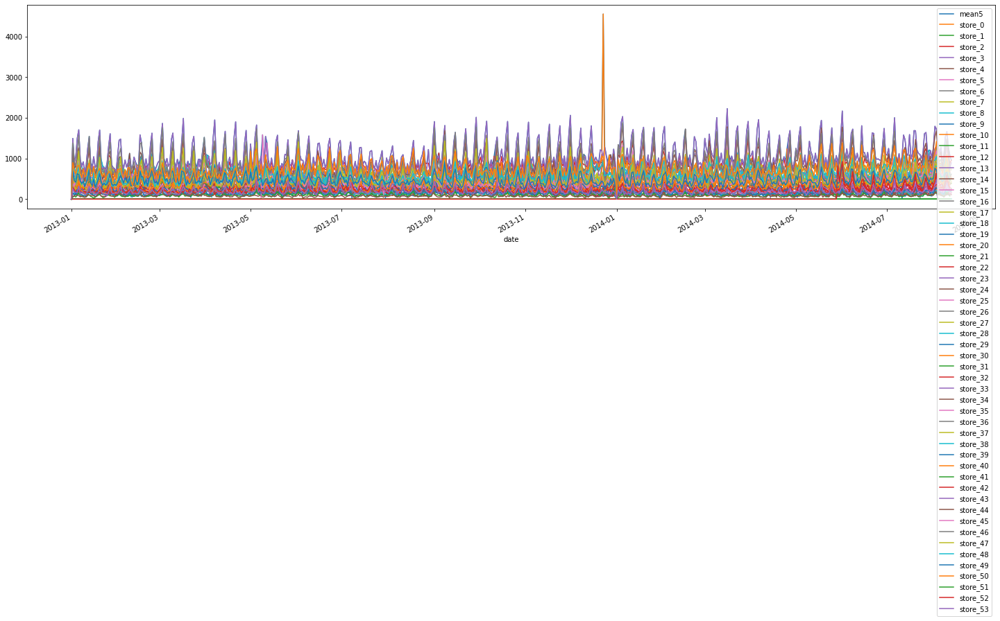

...

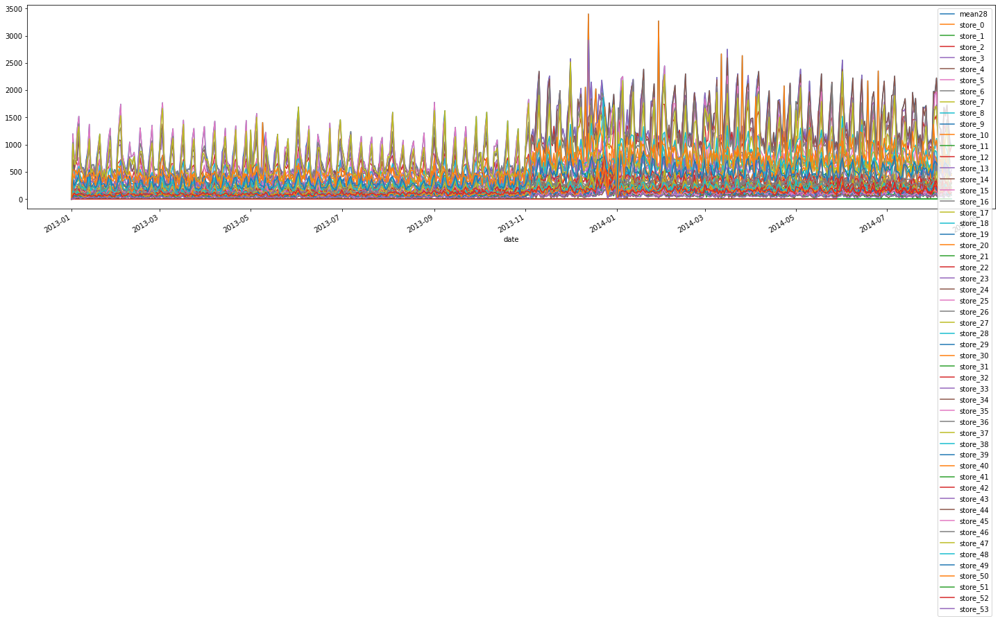

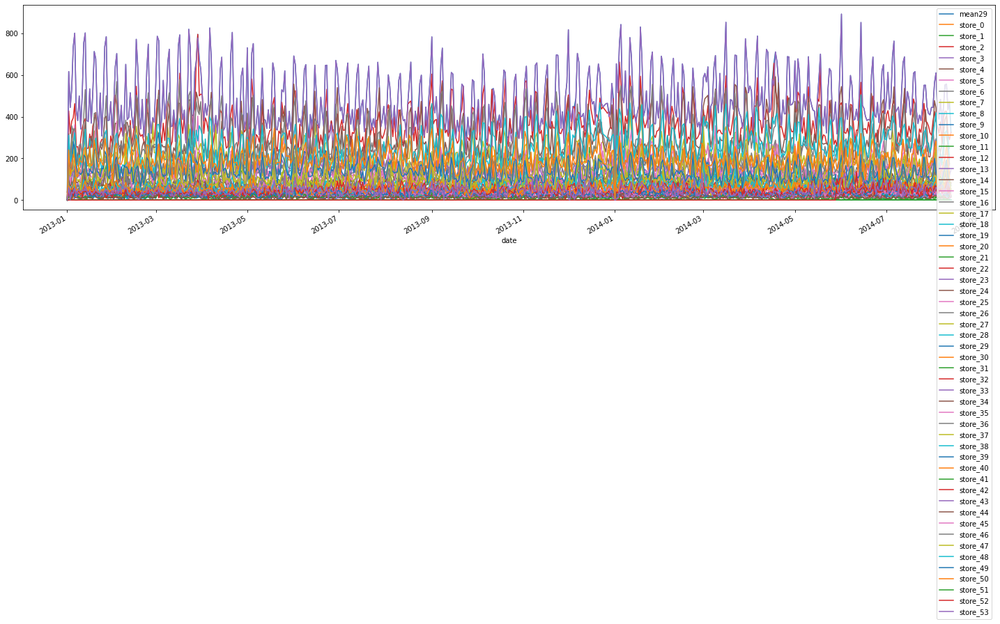

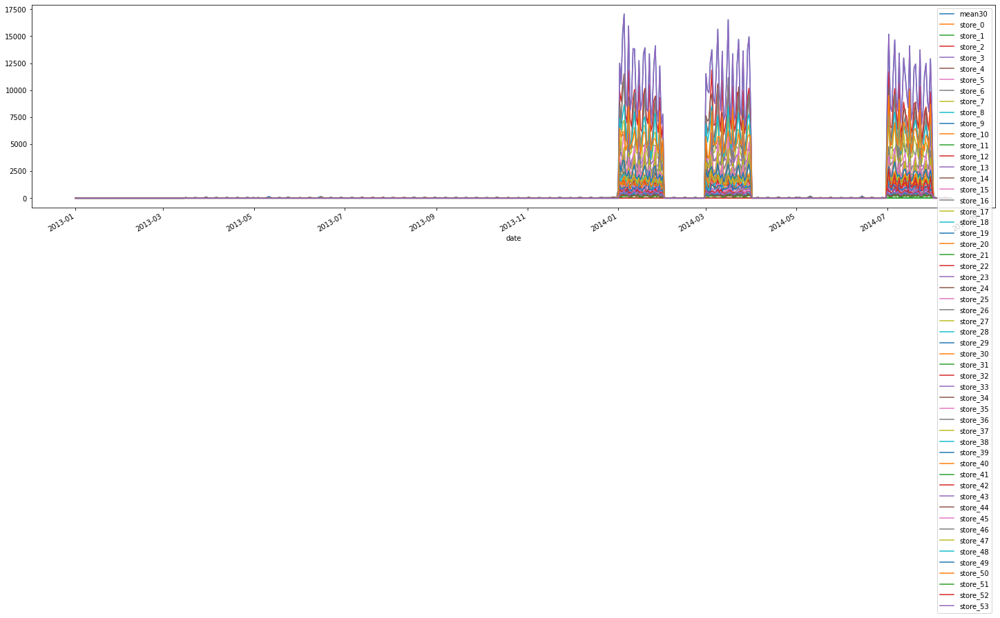

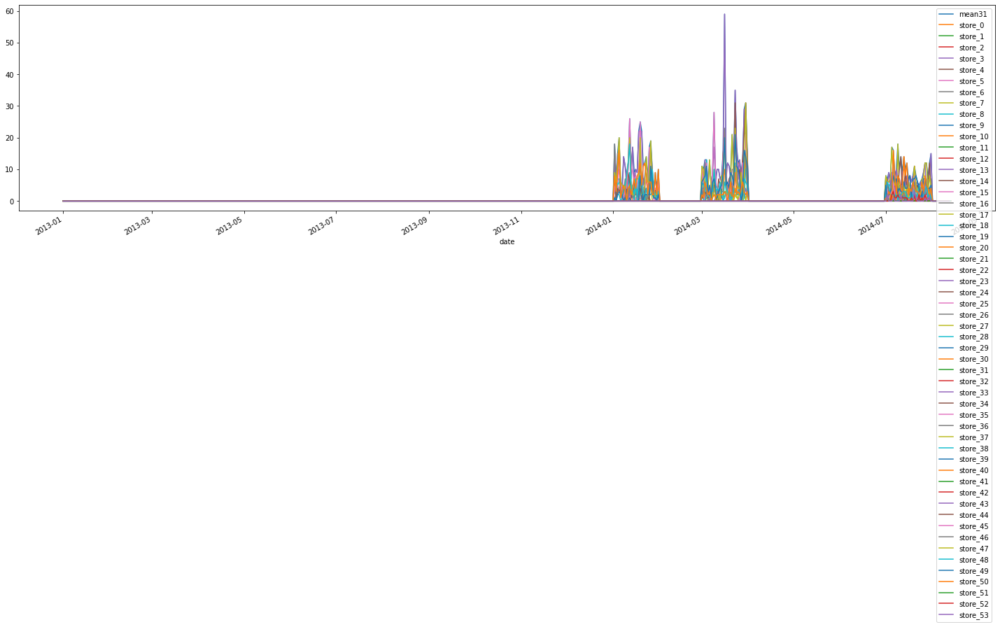

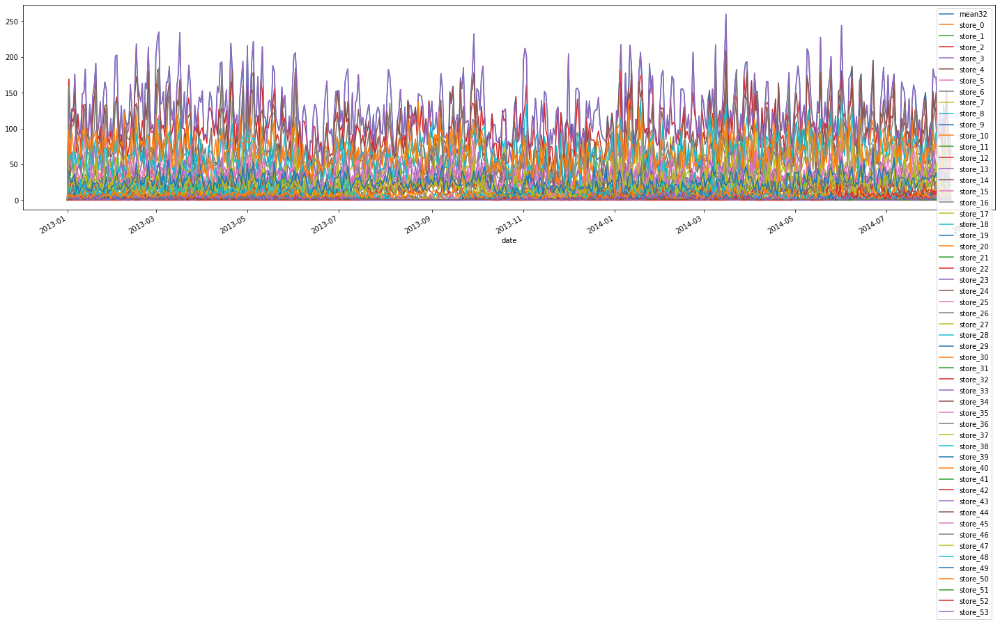

In [169]:
train_f_map=list()
for i in range(len(train_x_all)):
    if i in group:continue
    family_num,train_x = train_x_all[i][0],train_x_all[i][1]
    compare_store = train_x.groupby(['date'],as_index=False).agg({'sales':"max"}).rename(columns={"sales":"mean"+str(i)})
    store = list(train_x.groupby(['store_nbr'],as_index=False))
    for s in range(len(store)):
        # if s!=9: continue
        table = store[s][1]
        table = table.groupby(['date'],as_index=False).agg({"sales":"mean"}) #max min mean 都一樣
        # table['sales'] = [abs(compare_store['mean'][m]-table['sales'][m]) for m in range(len(table['sales']))]
        table.rename(columns={"sales":"store_"+str(s)},inplace=True)
        compare_store = compare_store.merge(table,on='date',how='left')
        # break
    compare_store.set_index("date",inplace=True)
    # compare_store.iloc[588] = compare_store.iloc[588].fillna(0)
    compare_store.iloc[:589].plot()
    plt.savefig("eda3/分類商品/商品 "+str(i)+" 在每間店的銷售價")
    train_f_map.append([compare_store])
    # if i ==2:break


In [ ]:
train_f_map=list()
for i in range(len(train_x_all)):
    scaler = MinMaxScaler(feature_range=(0,1))
    family_num,train_x = train_x_all[i][0],train_x_all[i][1]
    train_x = train_x.groupby(['date'],as_index=False).agg(train_condition)#ok
    train_x.set_index(train_x.date).drop(columns=['date']).iloc[0:589][["sales","dcoilwtico"]].plot()
  

### Train_data handle

In [ ]:
history_input = 30

train_f_map=list()
for i in range(len(train_x_all)):
    scaler = MinMaxScaler(feature_range=(0,1))
    family_num,train_x = train_x_all[i][0],train_x_all[i][1]
    train_x = train_x.groupby(['date'],as_index=False).agg(train_condition)#ok
    train_x.set_index(train_x.date).drop(columns=['date']).iloc[0:589][["sales","dcoilwtico"]].plot()
    # break
    continue
    # if i==0:print(train_x)
    for col in number_cols+object_cols:
        train_x[col] = scaler.fit_transform(train_x[col].values.reshape(-1,1))
    train_x = train_x[:589]
    train_y = train_x[['date','sales']]
    train_x.drop(columns=['date','sales','family'],inplace=True)#,'store_nbr','family','onpromotion','locale','store_type','cluster'
    train_y.drop(columns=['date'],inplace=True)

    
    train_input = []
    train_output = []
    for i in range(len(train_x)-history_input+1):
        train_input.append(train_x[i:i+history_input].values)
        train_output.append(train_y.iloc[i+history_input-1])
    train_input=np.array(train_input)
    train_output=np.array(train_output)

    train_f_map.append([train_input,train_output])#,scaler])


In [ ]:
print(train_f_map[0][0].shape)
print(train_f_map[0][1].shape)

In [ ]:
# def Make_Model_GRU():    

In [ ]:
def Multi_Step_LSTM_model():
    
    # Use Keras sequential model
    model = Sequential()    
    
    # First LSTM layer with Dropout regularisation; Set return_sequences to True to feed outputs to next layer
    model.add(LSTM(units = 50, activation='relu', kernel_initializer='he_uniform', return_sequences = True, input_shape = train_input[0].shape )) 
    model.add(Dropout(0.2))
    
    # Second LSTM layer with Dropout regularisation; Set return_sequences to True to feed outputs to next layer
    model.add(LSTM(units = 50,  activation='relu', kernel_initializer='he_uniform', return_sequences = True))                                    
    model.add(Dropout(0.2))
    
    # Final LSTM layer with Dropout regularisation; Set return_sequences to False since now we will be predicting with the output layer
    model.add(LSTM(units = 50))
    model.add(Dropout(0.2))
    
    # The output layer with linear activation to predict Open stock price
    model.add(Dense(units=1, activation = "linear"))
    
    return model

In [ ]:
for i in range(len(train_f_map)):
    train_input = train_f_map[i][0]
    train_output = train_f_map[i][1]

    model = Multi_Step_LSTM_model()
    model.compile(optimizer='adam', loss='mean_squared_error')#, metrics = ['accuracy'])
    early_stop = EarlyStopping(monitor='val_loss',patience=2,verbose=1)
    history = model.fit(train_input,train_output, validation_split=0.3,batch_size=4, epochs=100,callbacks=early_stop)
    train_f_map[i].append(model)
    train_f_map[i].append(history)
    # break


In [ ]:
def draw(history,num):
    # val_acc = np.mean(history.history['val_accuracy'])
    # print("\n%s: %.2f%%" % ('val_acc', val_acc*100))
    # plt.plot(history.history['accuracy'])
    # plt.plot(history.history['val_accuracy'])
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model accuracy '+str(num))
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    # plt.legend(['train_acc', 'validation_acc','train_loss','val_loss'], loc='upper left')
    plt.legend(['train_loss','val_loss'], loc='upper left')

    # plt.legend(['train','loss'], loc='upper left')
    plt.show()
for i in range(len(train_f_map)):
    model = train_f_map[i][2]
    history = train_f_map[i][3]

    draw(history,i)
    # serialize model to JSON
    model_json = model.to_json()
    with open(filepath+"model_f"+str(i)+".json", "w") as json_file:
        json_file.write(model_json)
    # serialize weights to HDF5
    model.save_weights(filepath+"model_f"+str(i)+".json.h5")
    print("model_f"+str(i)+"Saved model to disk")
    # break

# Perdict

In [ ]:
test_x_all =  df[num_train:].copy().drop(columns=['sales'])
test_x_all = list(test_x_all.groupby(["family"],as_index=False))

train_x_all_buf =  df[:num_train].copy().drop(columns=['sales'])
train_x_all_buf = list(train_x_all_buf.groupby(["family"],as_index=False))

In [ ]:
test_f_map=list()
for i in range(len(test_x_all)):
    test_x = test_x_all[i][1]
    test_x = test_x.groupby(['date'],as_index=False).agg(condition)

    family_num,train_x_buf = train_x_all_buf[i][0],train_x_all_buf[i][1]
    train_x_buf = train_x_buf.groupby(['date'],as_index=False).agg(condition)#ok
    # for col in number_cols+object_cols:
    #     if col=='sales':continue
    #     train_x_buf[col] = scaler.fit_transform(train_x_buf[col].values.reshape(-1,1))

    test_x = pd.concat([train_x_buf[-1*(history_input)+1:],test_x],ignore_index=True)
    test_f_map.append([test_x])


In [ ]:
test_output = []
test_ = df[num_train:].copy()
for i in range(len(test_['date'])):
    test_input = []
    f_num = int(test_['family'].iloc[0])
    # print(f_num)
    test_x = test_f_map[f_num][0]

    end = test_x.index[test_x['date']==test_['date'].iloc[i]].tolist()[0]
    start = end - history_input + 1
    test_input.append(pd.concat([test_x[start:end],test_[i:i+1]]).drop(columns=['date','sales','family']).values)
    test_input=np.array(test_input)

    model = train_f_map[f_num][2]
    y_pred = model.predict(test_input)
    test_output.append(y_pred[0].tolist()[0])

    if i%100==0:
        print("Count ",i/100," *100 data.")


In [ ]:
print(test_output)

In [ ]:
test_data = pd.read_csv('test.csv')
submit = test_data[['id']]
submit['sales'] = test_output

In [ ]:
submit.to_csv(filepath+"submit.csv",index=False,sep=',')
import zipfile
with zipfile.ZipFile(filepath+'submit.zip', 'w') as zf:
    zf.write(filepath+'submit.csv')